# Data Processing Approach for Portfolio Project

## Project Title: Tomato Disease Detection Model

## Student Name: Dimitri Kwihangana

---

1. **Data Sources and Aggregation:**
   - **Sources of Data:**
     - Kaggle Dataset [ Tomato Leaf Dataset](https://www.kaggle.com/datasets/kaustubhb999/tomatoleaf)  
     - Research Article[ Application of Machine Learning for Disease Detection](https://www.sciencedirect.com/science/article/abs/pii/S026121941500071X)

   


 **Data Structure:**
   tomato/
  ├── train/
  │   ├── class1/ (images)
  │   ├── class2/ (images)
  │   ├── class3/ (images)
  │   └── class4/ (images)
  └── val/
      ├── class1/ (images)
      ├── class2/ (images)
      ├── class3/ (images)
      └── class4/ (images)

**Explanation:**
tomato/: Root directory of the dataset.
train/: Contains training images, organized into four classes (class1, class2, class3, class4).
val/: Contains validation images, organized similarly into four classes (class1, class2, class3, class4).



**2. Data Format Transformation**
Current Format

 - Images: Stored in JPG format.
 - Labels: Folders are labeled with disease names.
 
 **Planned Transformation**

  
  - Convert all images to a consistent size (e.g., 224x224 pixels).
  - Ensure all images are in the same color space (RGB).

  **Labels:**
 - Encode folder names into numerical labels using a label encoder. This numerical encoding is necessary for machine learning models which typically require numerical inputs.

**3. Data Exploration**


   Features Included in the Dataset

  - Images: The pixel values of images representing tomato leaves affected by different diseases.
  - Labels: The disease names derived from the folder structure, corresponding to the different classes (e.g., class1, class2, class3, class4).



In [3]:
import tensorflow as tf

from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(rescale=1.0 / 255)  # Normalize pixel values
train_generator = datagen.flow_from_directory(
    "tomato/train",
    target_size=(64, 64),
    batch_size=32,
    color_mode="grayscale",
    class_mode="categorical",
)

validation_generator = datagen.flow_from_directory(
    "tomato/val",
    target_size=(64, 64),
    batch_size=32,
    color_mode="grayscale",
    class_mode="categorical",
)

Found 4000 images belonging to 4 classes.
Found 400 images belonging to 4 classes.


**Summary of Exploratory Data Analysis (EDA)**

 - Distribution: Evaluate the distribution of images across different classes to ensure that the dataset is balanced or identify any imbalance.
- Correlations: Although typically more relevant for tabular data, you can still look for patterns in the image data that might indicate correlations.
- Outliers: Identify any images that are corrupted, wrongly classified, or significantly different in size or color distribution from the rest of the dataset.
   
  **Insert code for data exploration below**

Training Images:
Class: Tomato___Early_blight


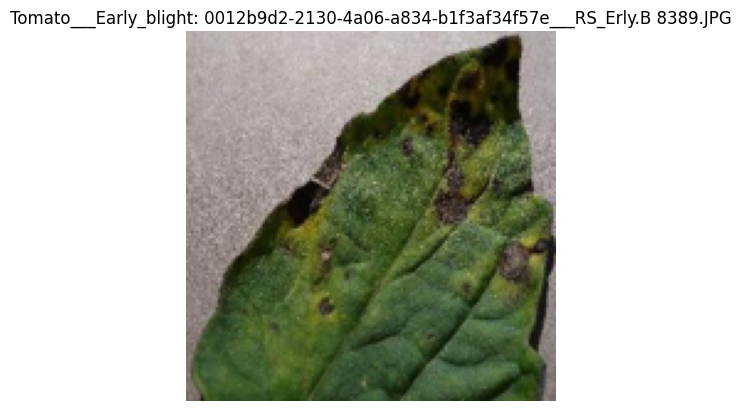

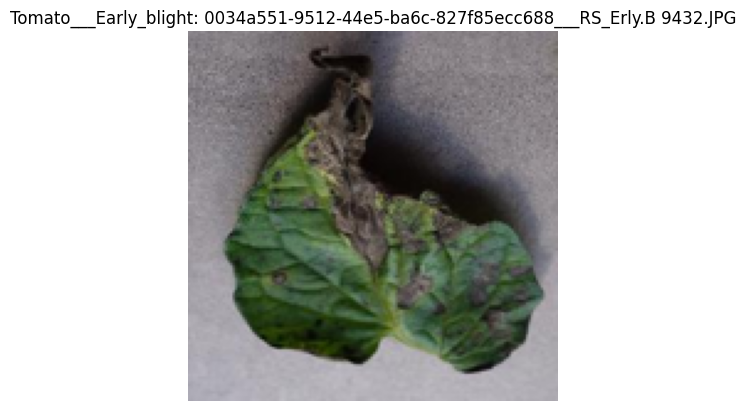

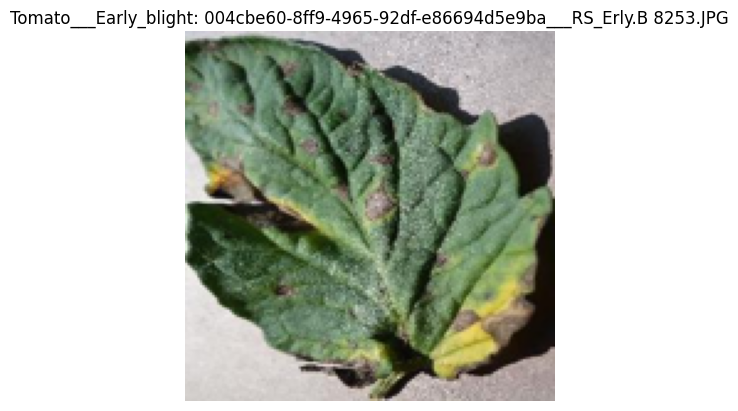

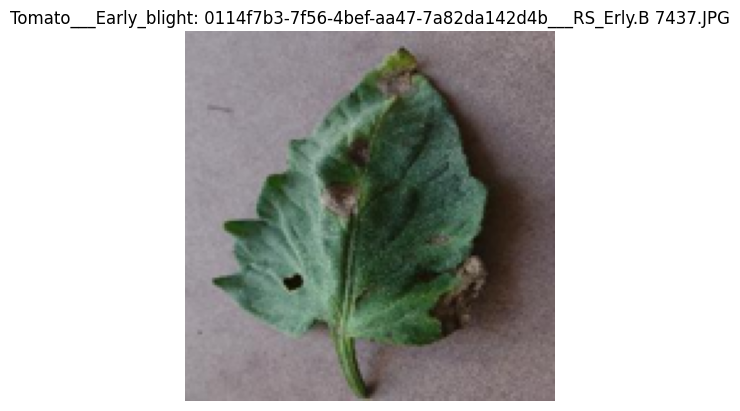

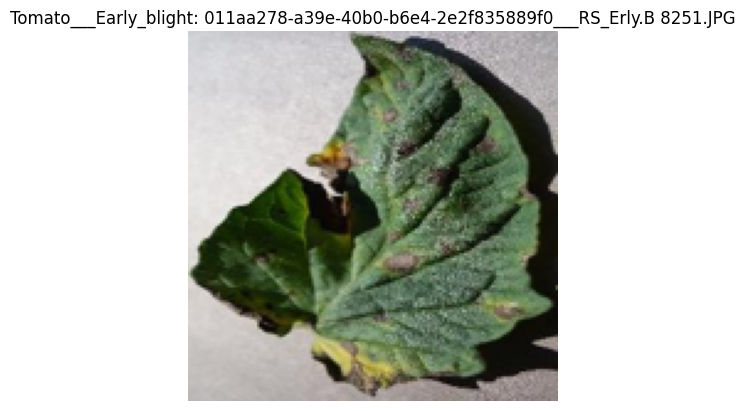

Class: Tomato___Septoria_leaf_spot


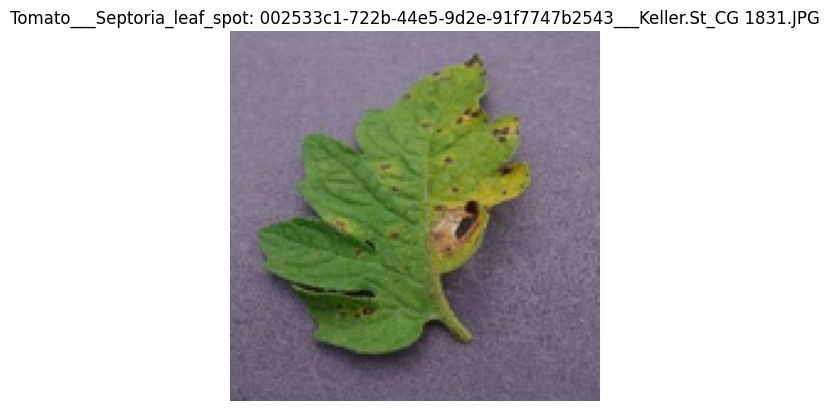

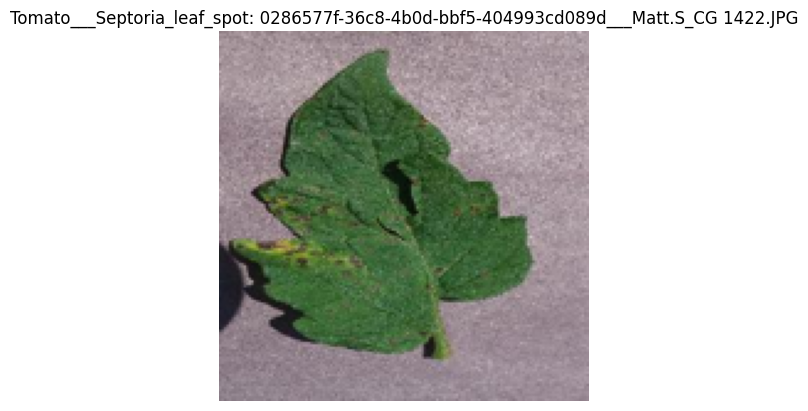

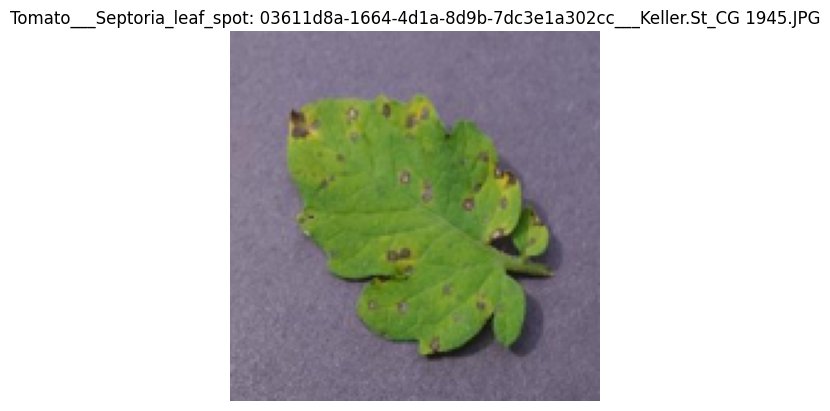

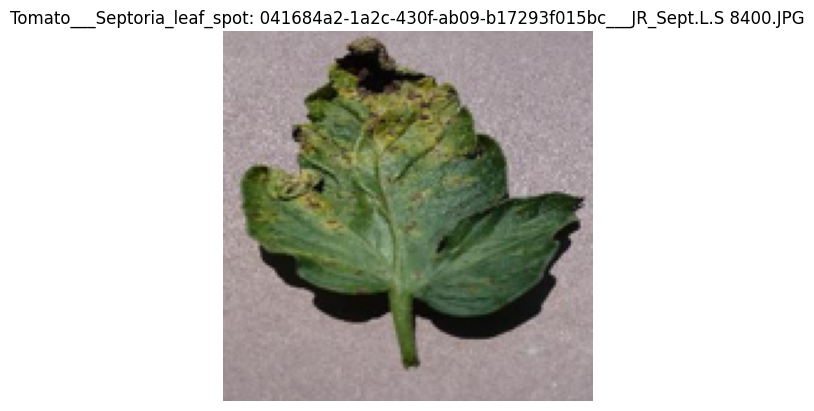

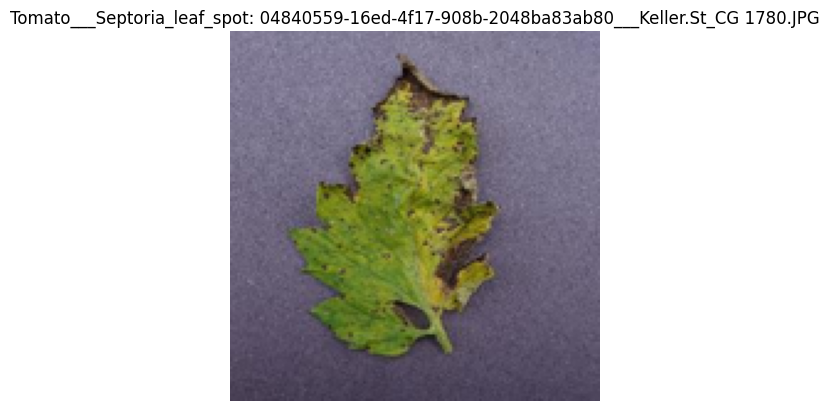

Class: Tomato___Target_Spot


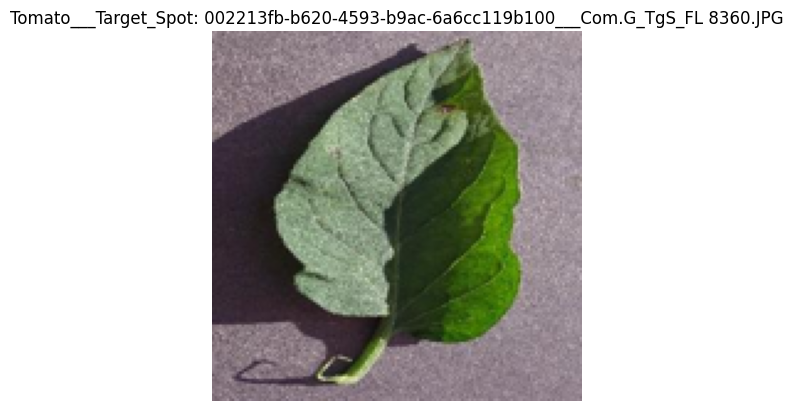

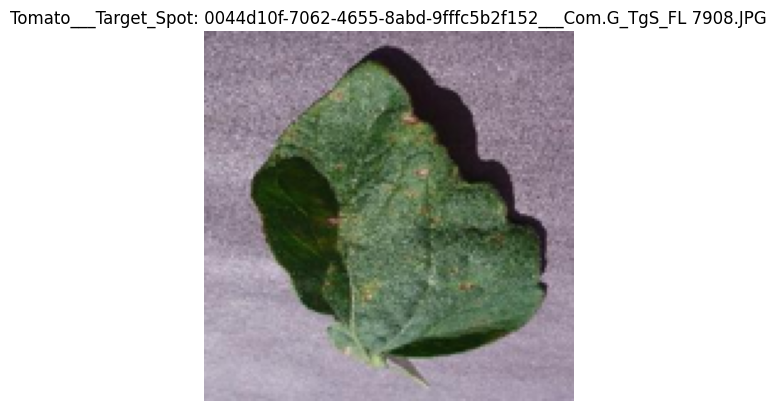

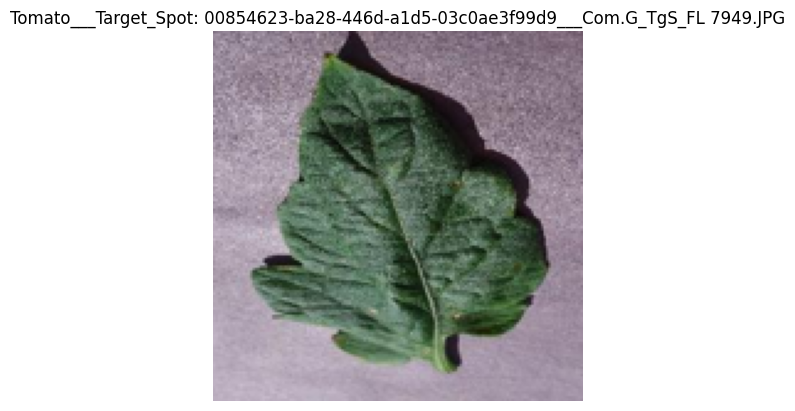

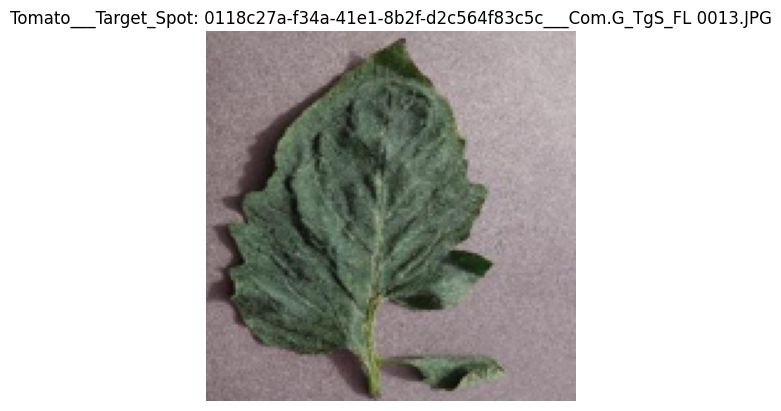

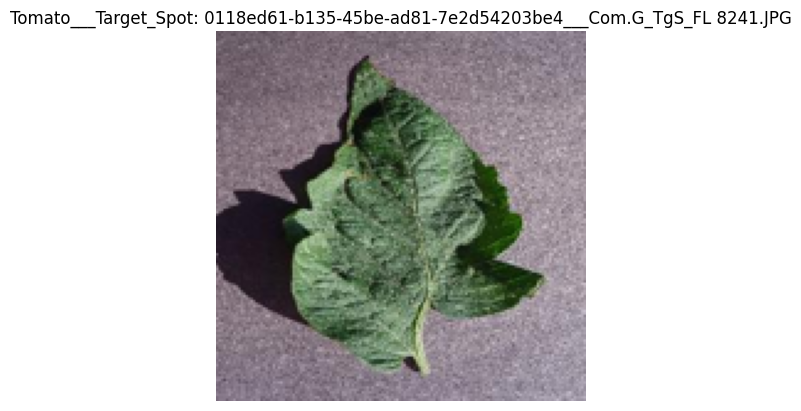

Class: Tomato___Tomato_mosaic_virus


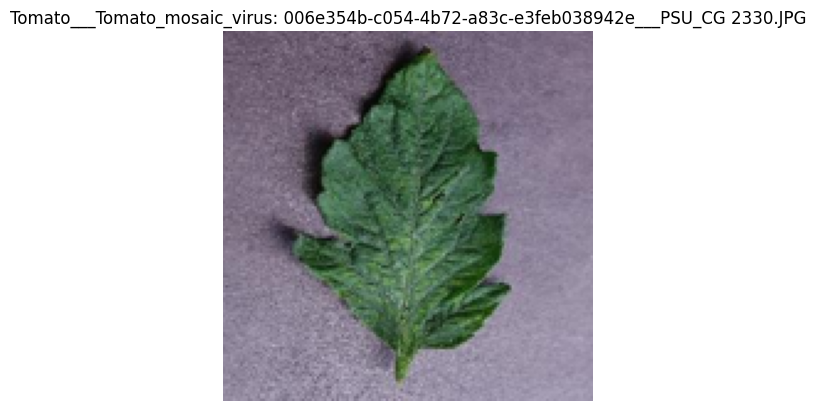

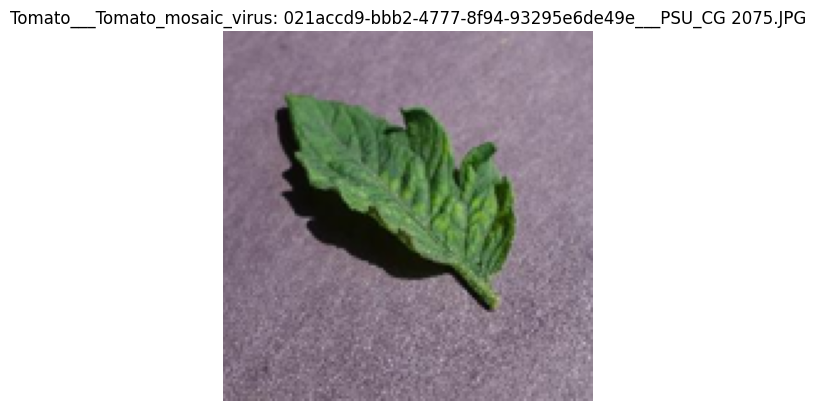

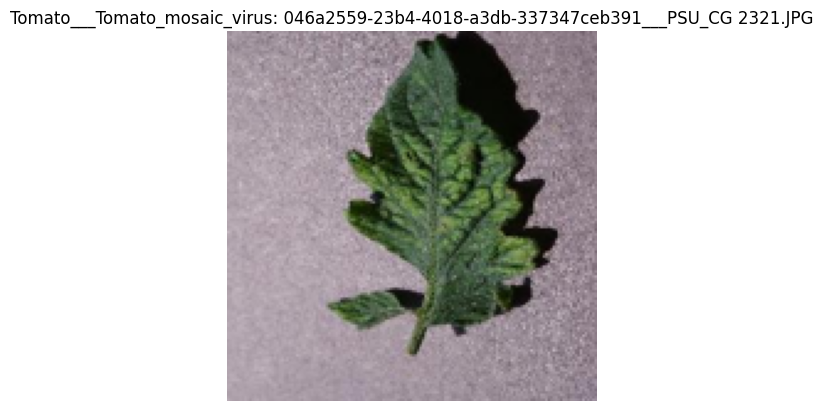

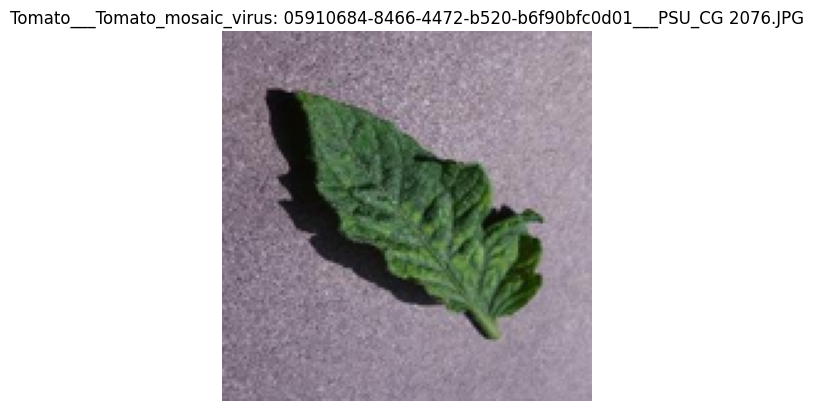

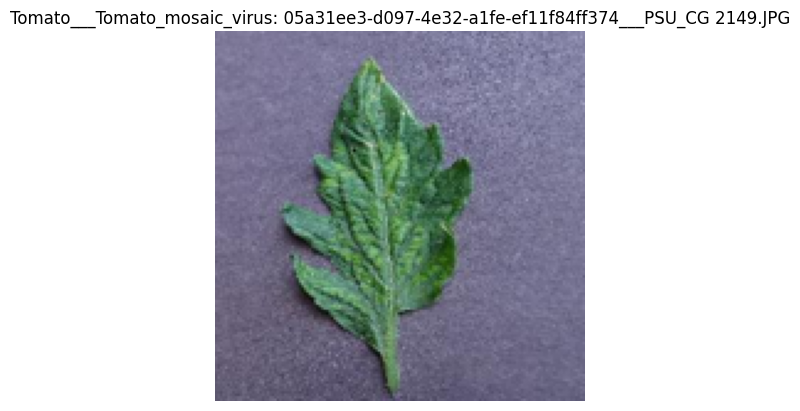

Validation Images:
Class: Tomato___Early_blight


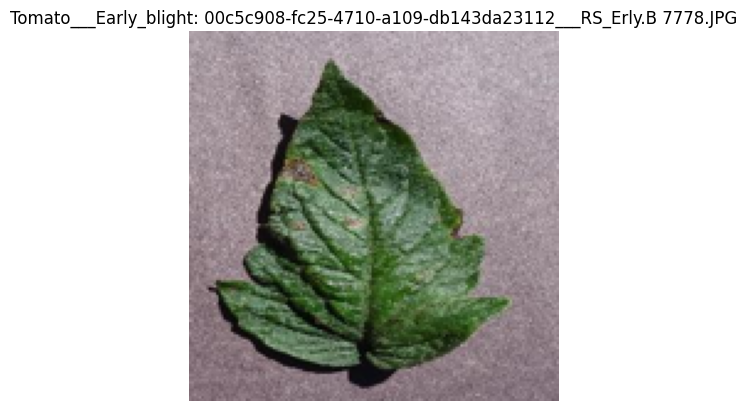

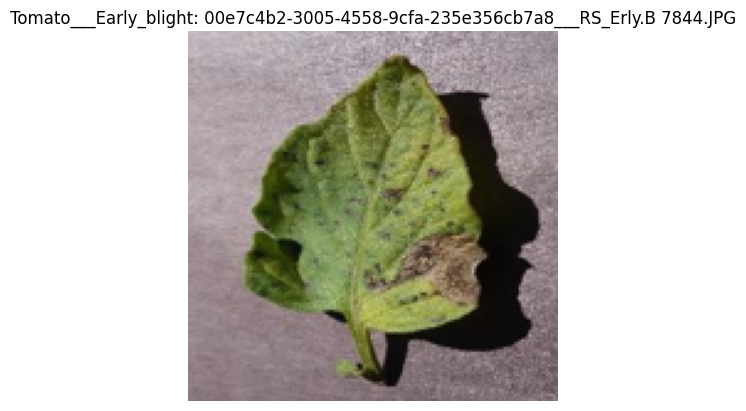

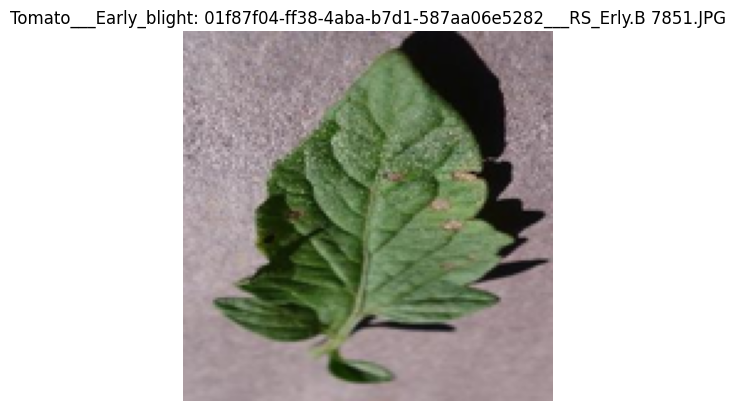

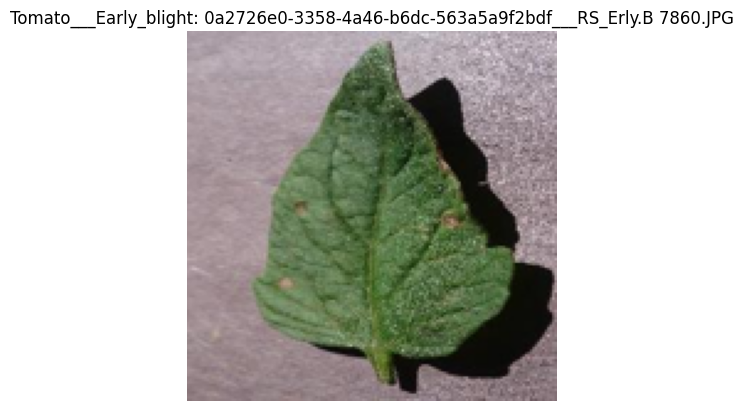

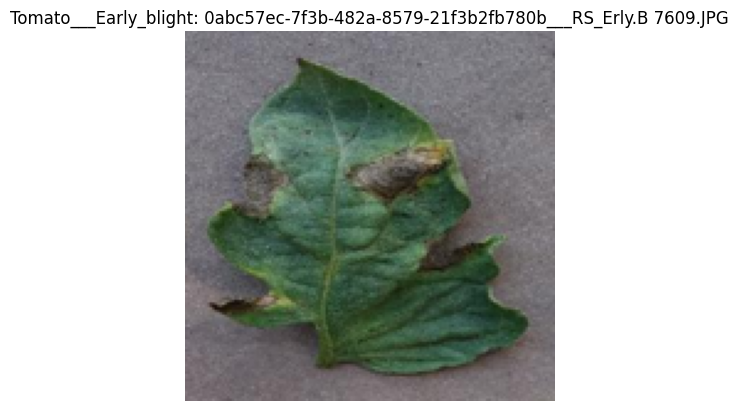

Class: Tomato___Septoria_leaf_spot


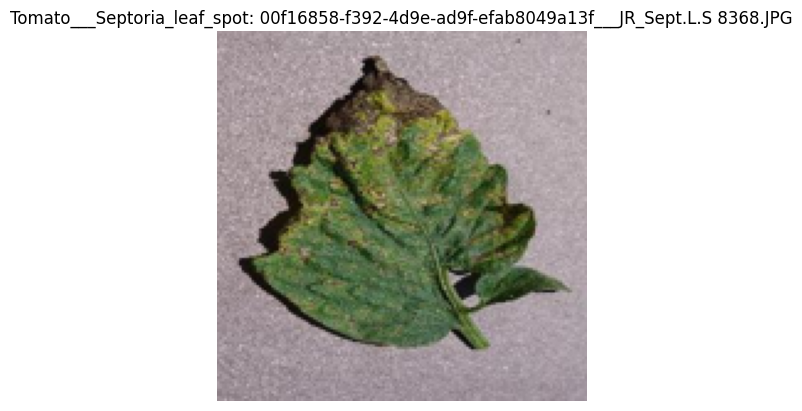

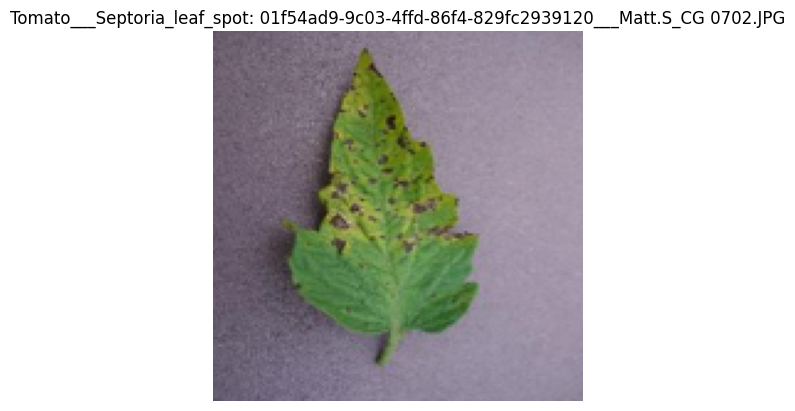

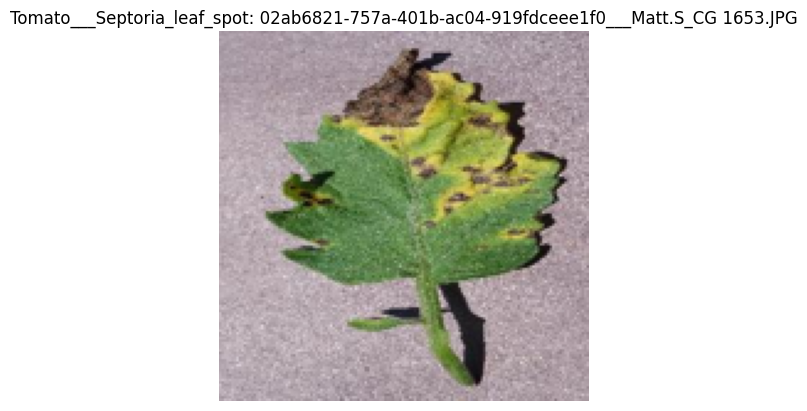

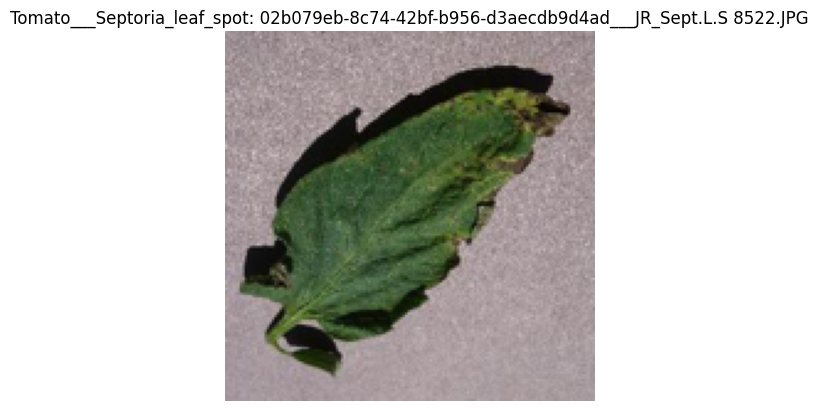

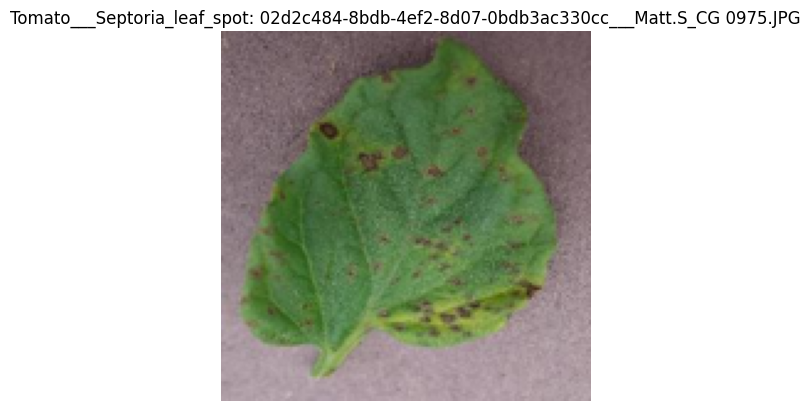

Class: Tomato___Target_Spot


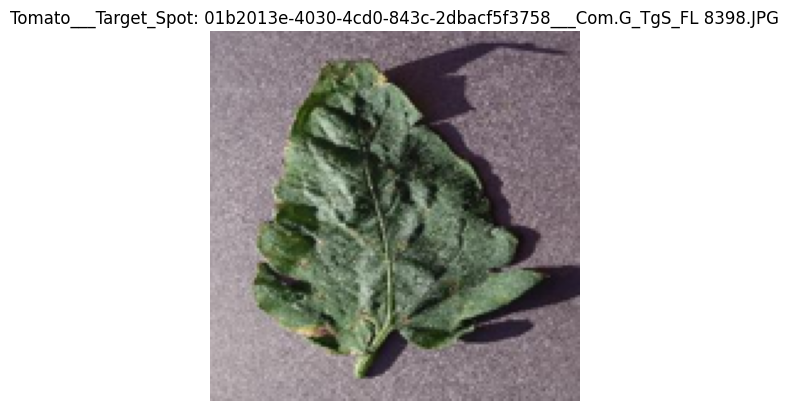

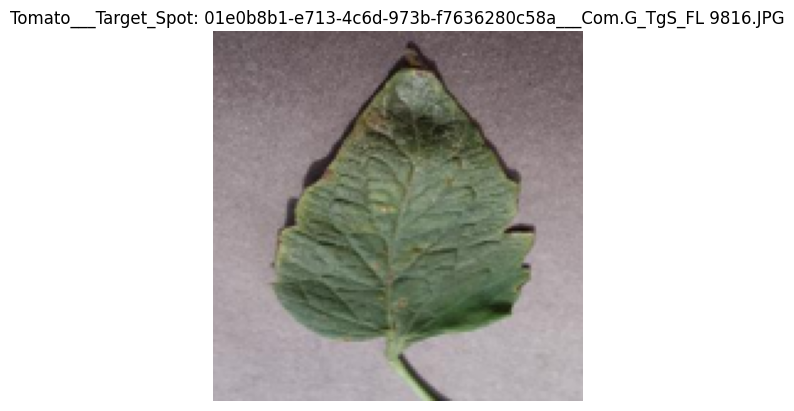

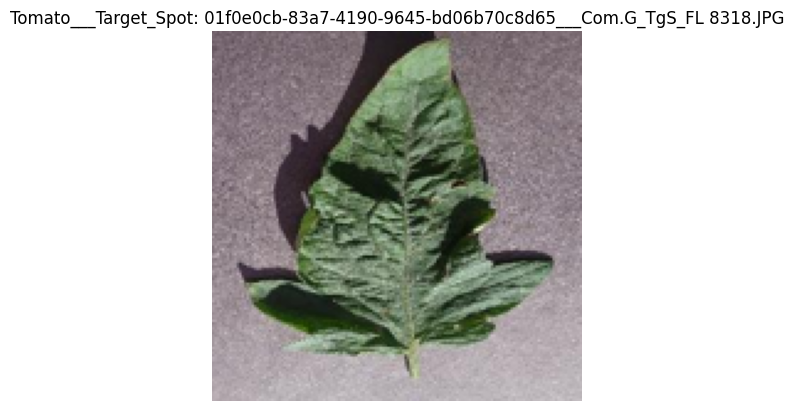

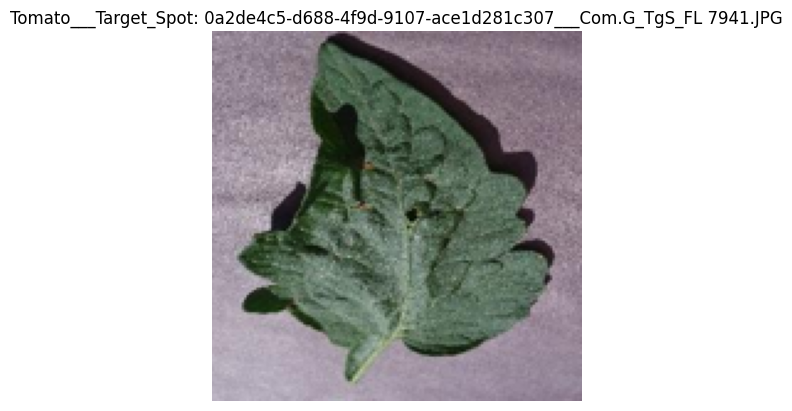

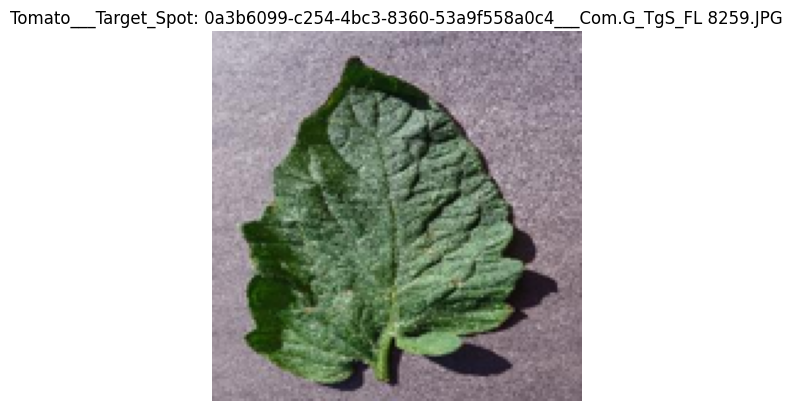

Class: Tomato___Tomato_mosaic_virus


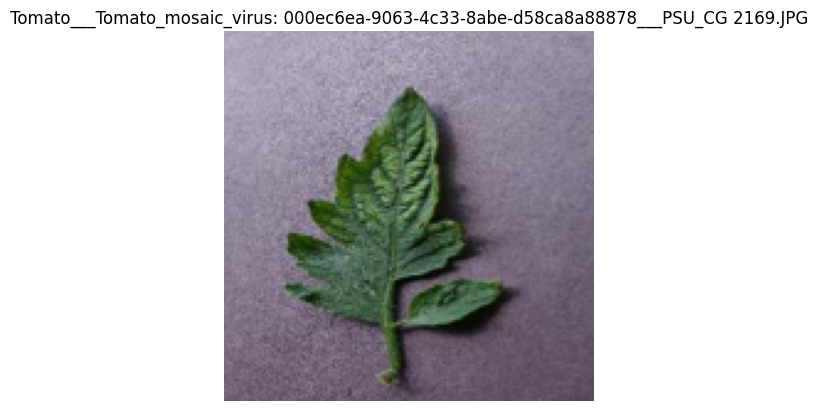

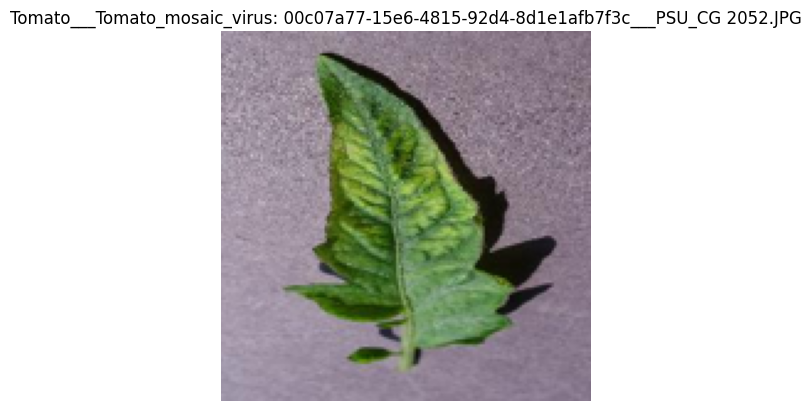

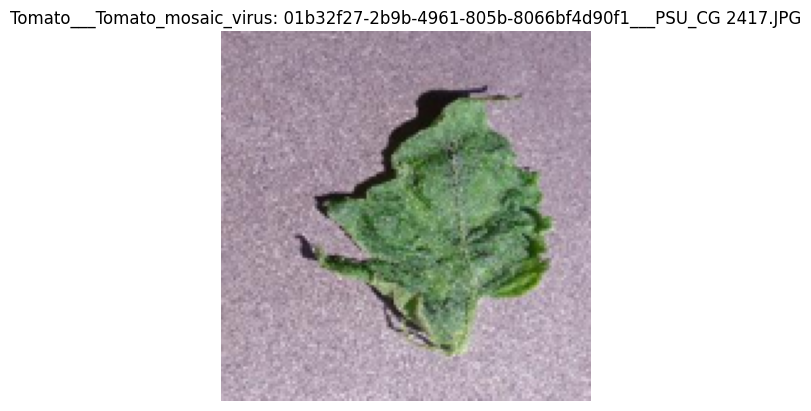

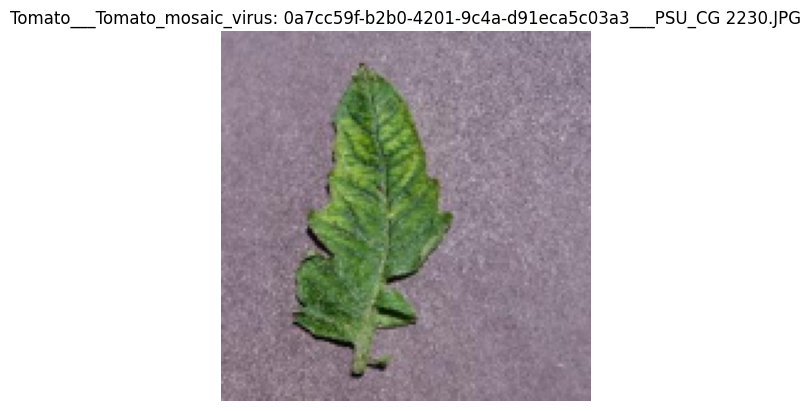

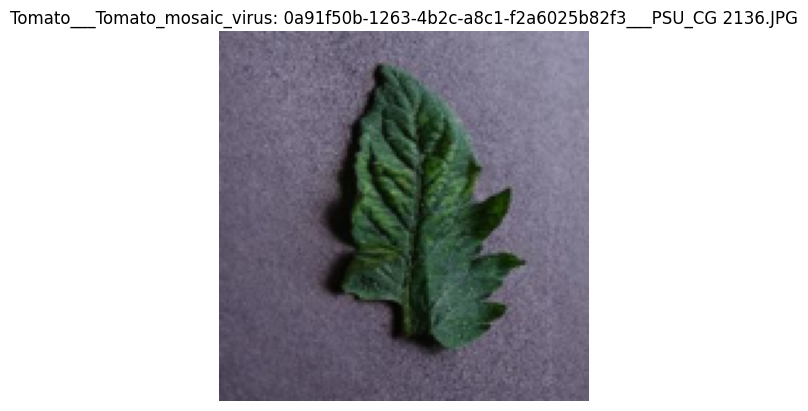

In [24]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define the base directory
base_dir = 'tomato'

# Directories for training and validation data
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')

# Function to display images from a directory
def display_images_from_directory(directory, num_images=5, img_width=150):
    classes = os.listdir(directory)
    for cls in classes:
        cls_dir = os.path.join(directory, cls)
        if os.path.isdir(cls_dir):
            print(f'Class: {cls}')
            images = os.listdir(cls_dir)
            for img_name in images[:num_images]:
                img_path = os.path.join(cls_dir, img_name)
                with Image.open(img_path) as img:
                    # Resize image to a smaller width
                    img = img.resize((img_width, int(img.height * img_width / img.width)))
                    plt.imshow(img)
                    plt.title(f'{cls}: {img_name}')
                    plt.axis('off')
                    plt.show()

# Function to plot distribution of categories

print("Training Images:")
display_images_from_directory(train_dir)

print("Validation Images:")
display_images_from_directory(val_dir)



Training Category Distribution:


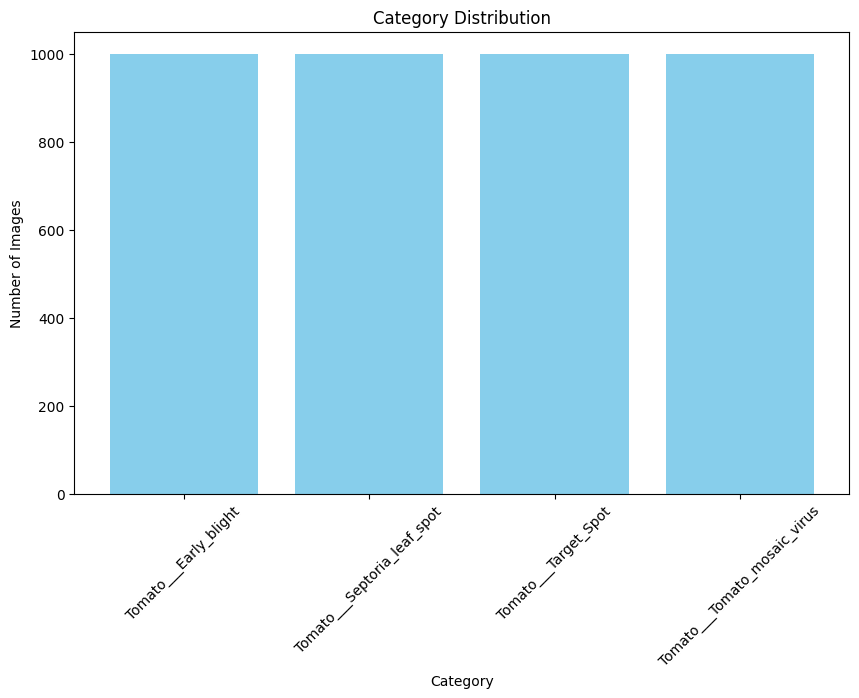

Validation Category Distribution:


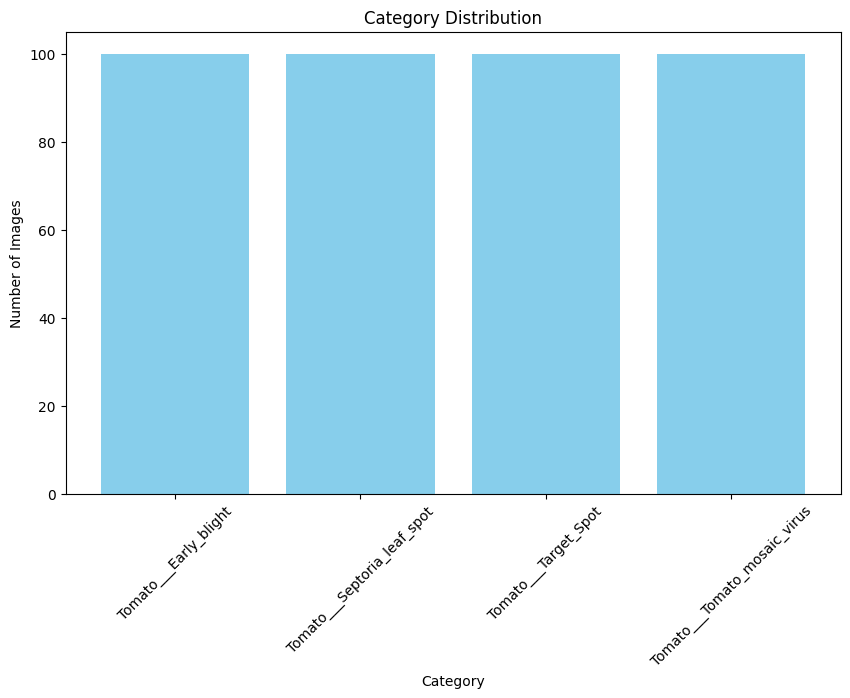

In [25]:
def plot_category_distribution(directory):
    category_counts = {}
    classes = os.listdir(directory)
    for cls in classes:
        cls_dir = os.path.join(directory, cls)
        if os.path.isdir(cls_dir):
            images = os.listdir(cls_dir)
            category_counts[cls] = len(images)

    # Plotting the distribution as a bar graph
    plt.figure(figsize=(10, 6))
    plt.bar(category_counts.keys(), category_counts.values(), color='skyblue')
    plt.xlabel('Category')
    plt.ylabel('Number of Images')
    plt.title('Category Distribution')
    plt.xticks(rotation=45)
    plt.show()

# Display a few images from the train and validation directories
# Plot distribution of categories for training and validation data
print("Training Category Distribution:")
plot_category_distribution(train_dir)

print("Validation Category Distribution:")
plot_category_distribution(val_dir)

**Hypothesis Testing**

***Preexisting Hypotheses**
- **Hypothesis 1**: Tomato size differs by category (e.g., "Cherry" vs "Roma").
- **Hypothesis 2**: Ripeness correlates with tomato color (red = riper).
- **Hypothesis 3**: Tomato category impacts farm yield.

***Methodologies***
- **Hypothesis 1**: Use t-test/ANOVA to compare sizes across categories.
- **Hypothesis 2**: Use correlation or regression to assess the relationship between ripeness and size.
- **Hypothesis 3**: Use chi-square test to check the relationship between category and yield.

**5.Handling Sparse/Dense Data and Outliers**

**Data Density**
- Check the sparsity of data by calculating missing values.
- Identify imbalanced categories.

**Strategies**
- **Missing Data**: Impute numerical data with the median and categorical data with the mode.
- **Outliers**: Use the IQR method to detect and remove outliers.




# Hypothesis Testing

#### 6. Data Splitting
The following methodology is used to split the dataset into training, validation, and testing sets:

##### Methodology:
- **Random Splitting**: We will use random sampling to ensure the subsets are representative of the entire dataset. This helps in reducing the potential for bias in the selection process.
- **Training Set**: The majority of the data (typically 70-80%) will be used for training the model.
- **Validation Set**: A smaller portion of the data (usually 10-15%) will be used for validation during model tuning and hyperparameter optimization.
- **Testing Set**: The remaining data (typically 10-15%) will be reserved for testing the final model performance, ensuring it is not influenced by any adjustments made during the training phase.

### Criteria:
- **Randomness**: All samples have an equal chance of being selected for any of the subsets.
- **Representativeness**: The data in each subset should reflect the overall distribution of the dataset in terms of key variables (e.g., class balance, distribution of values).
- **Stratified Sampling**: For imbalanced datasets, stratified sampling will be used to ensure each subset has a proportional representation of each class.

---

### 7. Bias Mitigation

### Methodology:
- **Bias Identification**: 
   - Analyze the dataset for any inherent biases in data collection or representation (e.g., gender, race, or socioeconomic status).
   - Use statistical tests like chi-square or correlation analysis to identify potential biases in features.

- **Bias Mitigation Techniques**: 
   - **Re-sampling**: In case of imbalanced classes, re-sampling methods like oversampling or undersampling will be used to balance the classes.
   - **Fairness Constraints**: Implement fairness constraints during the model training phase to ensure that the model does not disproportionately benefit or harm any particular group.
   - **Data Augmentation**: Increase the diversity of the data by applying techniques like synthetic data generation, especially in cases where certain groups or features are underrepresented.

- **Ensuring Fairness**:
   - Apply techniques like fairness-aware modeling (e.g., adversarial debiasing) to prevent bias in predictions.
   - Evaluate model fairness using fairness metrics (e.g., demographic parity, equal opportunity) to ensure that the model performs equitably across different groups.



**class weights**

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight(
    "balanced", classes=np.unique(train_generator.classes), y=train_generator.classes
)
class_weights_dict = dict(enumerate(class_weights))

**Augmentation**

In [ ]:
datagen_augmented = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
)

8. **Features for Model Training:**
   - Identify relevant features for training the model.
   - Rank features based on their significance to project objectives.

 **Your answer for features must be plotted/ show your working code-wise **
9. **Types of Data Handling:**
   - Classify the types of data (categorical, numerical, etc.) present in the dataset.
   - Plan preprocessing steps for each data type.

   [**insert text for preprocessing steps**]


### Types of Data Handling

#### Data Classification:

- Categorical: Labels, plant species, conditions.
- Numerical: Image pixel values, histogram data.
#### Preprocessing:

- Categorical: Label encoding or one-hot encoding.
- Numerical: Scaling (MinMaxScaler/StandardScaler)

In [ ]:
#print out relevant features

### 10. Data Transformation for Modeling:
- Normalization/Scaling: Apply Min-Max scaling or Standardization (Z-score) to bring numerical features to a common scale.
- Categorical Encoding: Use One-Hot Encoding or Label Encoding for categorical variables to convert them into numerical format for model compatibility.
### 11.Data Storage:
- Storage Solutions: Store processed data in a relational database (e.g., PostgreSQL) for structured data or a NoSQL database (e.g., MongoDB) for unstructured data.
- Accessibility & Security: Implement encryption for data at rest and in transit, and ensure access controls (e.g., role-based) for secure data management.
---

#### Notes:
- This template provides a structured framework for documenting your data processing approach for the portfolio project.
- Fill out each section with specific details relevant to your project's requirements and objectives.
- Use additional cells as needed to provide comprehensive information.